In [1]:
# import the necessary packages
import numpy as np
import cv2
from matplotlib import pyplot as plt
import imutils
import math
import time

In [2]:
from os import listdir
from os.path import isfile, join
images_paths = sorted([f for f in listdir('../images') if isfile(join('../images', f))])

In [3]:
def detect_roi(image, visualize_bounding_box=False):
    """Detect the ROI surrounding the barcode in the given image.

    It returns the bounding box coordinates. In addition, it warps the bounding box, in order to rotate it and making the 
    bars perfectly vertical.

    This works both if the barcode is non-rotated (i.e. the bars are vertical) and if the barcode is rotated (i.e. the bars 
    are horizontal). 

    Parameters
    ----------
    image : np.array
        Input image.
    visualize_bounding_box : bool, optional
        Whether to visualize or not the input image with the detected bounding box, by default False
    visualize_final_image : bool, optional
        Whether to visualize or not the warped bounding box, by default False

    Returns
    -------
    bb_sorted : np.array
        Array 4x2, containing the coordinates of the four bounding box points. 
        The points are ordered in the following way: up-left, up-right, bottom-left, bottom-right.
    
    bb_image_warped : np.array
        Image representing the warped bounding box: the barcode bars are perfectly vertical.

    rotated : bool
        Whether the barcode was non-rotated (i.e. the bars were vertical) or rotated (i.e. the bars were horizontal).

    """

    # Convert the image to grey scale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Compute both the horizontal and vertical derivative, using the Sobel filter
    ddepth = cv2.cv.CV_32F if imutils.is_cv2() else cv2.CV_32F
    gradX = cv2.Sobel(gray, ddepth=ddepth, dx=1, dy=0, ksize=-1)
    gradY = cv2.Sobel(gray, ddepth=ddepth, dx=0, dy=1, ksize=-1)
    # Subtract the y-gradient from the x-gradient: we get the final gradient image
    gradient = cv2.subtract(gradX, gradY)
    gradient = cv2.convertScaleAbs(gradient)

    # Blur the gradient image    
    blurred = cv2.blur(gradient, (9, 9))

    # Threshold the gradient image
    _ ,thresh = cv2.threshold(blurred,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    # Closing: fill the bounding box
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    
    # Opening: remove small things outside
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 50))
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)
    
    # Dilate: slight enlarge the box
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (8, 8))
    dilated = cv2.dilate(opened, kernel, iterations=3)
    
    # Find the bounding box (OpenCV API)
    cnts = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = sorted(cnts, key = cv2.contourArea, reverse = True)[0]
    # Compute the rotated bounding box of the largest contour
    rect = cv2.minAreaRect(c)
    box = cv2.cv.BoxPoints(rect) if imutils.is_cv2() else cv2.boxPoints(rect)
    # This is our bounding box: 4 points, each of them 2 coordinates
    box = np.int0(box)  

    if visualize_bounding_box:
        # Draw a bounding box around the detected barcode and display the image
        image_bb = image.copy()
        cv2.drawContours(image_bb, [box], -1, (0, 255, 0), 3)
        plt.figure()
        plt.imshow(image_bb, 'gray')
        plt.title('Original image, with the bounding box')
    
    # Sorting the points of the bounding box, such that they follow the ordering: up-left, up-right, bottom-left, bottom-right.
    bb_sorted = box.astype('float32')
    min_width = bb_sorted[:,0].min()
    min_height = bb_sorted[:,1].min()
    max_width = bb_sorted[:,0].max()
    max_height = bb_sorted[:,1].max()
    def normalize(value, axis=0):
        if axis==0:  # Horizontal dimension
            return min_width if (value-min_width<max_width-value) \
                             else max_width
        elif axis==1:  # Vertical dimension
            return min_height if (value-min_height<max_height-value) \
                              else max_height
    bb_sorted = np.array(sorted([tuple(v) for v in bb_sorted], key=lambda t: (normalize(t[1], axis=1),
                                                                                                normalize(t[0], axis=0))))
    
    # Compute the width and height of the bounding box.
    def dist(point1, point2):
        return np.sqrt(np.sum((point1-point2)**2))
    bb_height = int(max([dist(bb_sorted[0],bb_sorted[2]),
                             dist(bb_sorted[1],bb_sorted[3])]))
    bb_width = int(max([dist(bb_sorted[0],bb_sorted[1]),
                             dist(bb_sorted[2],bb_sorted[3])]))


    return bb_sorted, bb_width, bb_height

In [4]:
def rotate_image(image, angle, center):
  #image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result, rot_mat

In [5]:
def rotate_image_boundingBox(image, bb_sorted, bb_width, bb_height):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    point1 = bb_sorted[0, :]
    point2 = bb_sorted[1, :]
    point3 = bb_sorted[2, :]
    point4 = bb_sorted[3, :]
    
    angle = math.degrees(math.atan((point2[1]-point1[1])/(point2[0]-point1[0])))
    """ TODO : CONSIDER THE OTHER ANGLES?
    angle2 = abs(math.degrees(math.atan((point4[1]-point3[1])/(point4[0]-point3[0]))))
    #print(angle2)
    angle3 = 90-abs(math.degrees(math.atan((point1[1]-point3[1])/(point1[0]-point3[0]))))
    #print(angle3)
    angle4 = 90-abs(math.degrees(math.atan((point2[1]-point4[1])/(point2[0]-point4[0]))))
    #print(angle4)"""
    
    gray_rot, rot_mat = rotate_image(gray, angle=angle, center=point1)
    """plt.figure()
    plt.imshow(gray_rot, 'gray')
    plt.title('Rotated image')"""
    
    bb_sorted_rot = np.array([point1,
                          [point1[0]+bb_width-1,point1[1]],
                          [point1[0],point1[1]+bb_height-1],
                          [point1[0]+bb_width-1,point1[1]+bb_height-1]], dtype='float32') 
    bb_rot = bb_sorted_rot.copy()
    bb_rot[2, :] = bb_sorted_rot[3, :]
    bb_rot[3, :] = bb_sorted_rot[2, :]
    
    image_rot, rot_mat = rotate_image(image, angle=angle, center=point1)
    image_rot_bb = image_rot.copy()
    cv2.drawContours(image_rot_bb, [bb_rot.astype(int)], -1, (0, 255, 0), 3)
    plt.figure()
    plt.imshow(image_rot_bb, 'gray')
    plt.title('Rotated image, with the rotated bounding box')
    
    return image_rot, gray_rot, bb_sorted_rot, bb_rot

In [6]:
def computing_roi_quantities(roi_image, bb_width, bb_height):
    _ ,thresh = cv2.threshold(roi_image,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    half_height = int(bb_height/2)
    
    first_bar_found = False
    X = bb_width

    min_half_height_up = half_height
    min_half_height_bottom = half_height

    i = 0
    while i<bb_width:
        if thresh[half_height, i]==255:
            #print('W', end='')
            i += 1
            continue

        #print('B', end='')
        if not first_bar_found:
            first_bar_x = i
            first_bar_found = True 

        X_curr = 1
        j = i+1
        while thresh[half_height, j]==0:
            #print('B', end='')
            X_curr += 1
            j += 1

        j_up = half_height-1
        j_bottom = half_height+1
        min_half_height_up_curr = 1
        min_half_height_bottom_curr = 1

        up_reached = False
        bottom_reached = False

        while not up_reached or not bottom_reached:
            X_tmp_up = X_curr
            X_tmp_bottom = X_curr

            if not up_reached:
                while thresh[j_up, j]==0:
                    X_tmp_up += 1
                    j +=1 
            if not bottom_reached:
                while thresh[j_bottom, j]==0:
                    X_tmp_bottom += 1
                    j +=1 
            X_curr = max([X_tmp_up,X_tmp_bottom])

            up_reached = j_up<=0 or np.all(thresh[j_up, i:j]==255)
            if X_curr==1:
               foreground_perc_points = (thresh[0:j_up, i]==0).sum()/thresh[0:j_up, i].shape[0]
               #print('Up', foreground_perc_points)
               up_reached = j_up<=0 or foreground_perc_points<0.1
            if not up_reached:
                j_up -= 1
                min_half_height_up_curr += 1

            bottom_reached = j_bottom>=bb_height-1 or np.all(thresh[j_bottom, i:j]==255)
            if X_curr==1:
               #bottom_reached = j_bottom>=bb_height-1 or np.all(thresh[j_bottom+1:min([bb_height-1,j_bottom+4]), i]==255)
               foreground_perc_points = (thresh[j_bottom:, i]==0).sum()/thresh[j_bottom:, i].shape[0]
               #print('Bottom', foreground_perc_points)
               bottom_reached = j_bottom>=bb_height-1 or foreground_perc_points<0.1
            if not bottom_reached:
                j_bottom += 1
                min_half_height_bottom_curr += 1

        if X_curr<X:
            X = X_curr

        if min_half_height_up_curr<min_half_height_up:
            min_half_height_up = min_half_height_up_curr

        if min_half_height_bottom_curr<min_half_height_bottom:
            min_half_height_bottom = min_half_height_bottom_curr

        i = j

    last_bar_x = j - 1
    
    return first_bar_x, last_bar_x, X, min_half_height_up, min_half_height_bottom 

In [7]:
def refine_roi(image_path):
    start_time = time.time()
    
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    #print(image.shape)
    """plt.figure()
    plt.imshow(gray, 'gray')
    plt.title('Original image')"""
    
    bb_sorted, bb_width, bb_height = detect_roi(image, visualize_bounding_box=True)
    half_height = int(bb_height/2)
    
    detecting_ROI_time = time.time()
    print('Time for detecting the ROI:', detecting_ROI_time-start_time)
    
    image_rot, gray_rot, bb_sorted_rot, bb_rot = rotate_image_boundingBox(image, bb_sorted, bb_width, bb_height)
    
    rotating_image_time = time.time()
    print('Time for rotating the image and the ROI:', rotating_image_time-detecting_ROI_time)
    
    roi_image = gray_rot[int(bb_sorted_rot[0][1]):int(bb_sorted_rot[0][1]+bb_height), int(bb_sorted_rot[0][0]):int(bb_sorted_rot[0][0]+bb_width)]
    
    first_bar_x, last_bar_x, X, min_half_height_up, min_half_height_bottom  = computing_roi_quantities(roi_image, bb_width, bb_height)
    
    computing_ROI_quantities_time = time.time()
    print('Time for computing the ROI quantities:', computing_ROI_quantities_time-rotating_image_time)
    
    bb_sorted_rot_ref = bb_sorted_rot.copy()
    bb_sorted_rot_ref[[0,2],0] = bb_sorted_rot[[0,2],0] - (10*X-first_bar_x) 
    bb_sorted_rot_ref[[1,3],0] = bb_sorted_rot[[1,3],0] + (10*X-(bb_width-last_bar_x)) 

    bb_rot_ref = bb_sorted_rot_ref.copy()
    bb_rot_ref[2, :] = bb_sorted_rot_ref[3, :]
    bb_rot_ref[3, :] = bb_sorted_rot_ref[2, :]
    
    # Draw a bounding box around the detected barcode and display the image
    image_rot_bb = image_rot.copy()
    cv2.drawContours(image_rot_bb, [bb_rot_ref.astype(int)], -1, (0, 255, 0), 3)
    plt.figure()
    plt.imshow(image_rot_bb, 'gray')
    plt.title('Refined bounding box')
    
    roi_image_ref = gray_rot[int(bb_sorted_rot_ref[0][1]):int(bb_sorted_rot_ref[2][1]), int(bb_sorted_rot_ref[0][0]):int(bb_sorted_rot_ref[1][0])]
    roi_image_ref = roi_image_ref[half_height-min_half_height_up:-(half_height-min_half_height_bottom),:]
    plt.figure()
    plt.imshow(roi_image_ref, 'gray')
    plt.title('Refined ROI')
    
    new_bb_height, new_bb_width  = roi_image_ref.shape
    new_half_height = new_bb_height//2
    #print(10*X, bb_width)
    
    roi_image_ref_show = gray_rot[int(bb_sorted_rot_ref[0][1]):int(bb_sorted_rot_ref[2][1]), int(bb_sorted_rot_ref[0][0]):int(bb_sorted_rot_ref[1][0])].copy()
    """roi_image_temp = roi_image_ref_tmp.copy()
    roi_image_temp[half_height-min_half_height_up,:] = (0,255,0)
    roi_image_temp[-(half_height-min_half_height_bottom),:] = (0,255,0)
    roi_image_temp[:,10*X] = (0,255,0)
    roi_image_temp[:,-10*X] = (0,255,0)"""
    plt.figure()
    plt.imshow(roi_image_ref_show, 'gray')
    #plt.vlines([10*X,-10*X], ymin=0, ymax=new_bb_height,  label='10*X')
    plt.axvline(10*X, c='orange', label='10*X')
    plt.axvline(new_bb_width-10*X+1, c='red', label='-10*X')
    plt.axhline(half_height-min_half_height_up, c='green', label='Min up height')
    plt.axhline(bb_height-(half_height-min_half_height_bottom), c='blue', label='Min bottom height')
    plt.title('Refined ROI, with the computed quantities')
    plt.legend()
    
    refining_ROI__time = time.time()
    print('Time for refining the ROI:', refining_ROI__time-computing_ROI_quantities_time)
    
    overall_time = time.time() - start_time
    print('Overall time:', overall_time)
    
    return overall_time

In [8]:
times = []

Time for detecting the ROI: 0.09720325469970703
Time for rotating the image and the ROI: 0.05730128288269043
Time for computing the ROI quantities: 0.19819116592407227
Time for refining the ROI: 0.07824444770812988
Overall time: 0.4309401512145996
Wall time: 431 ms


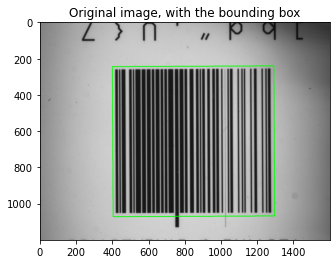

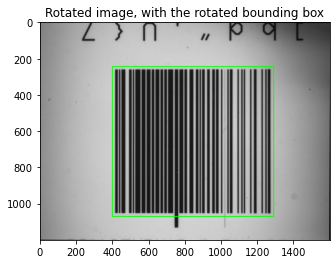

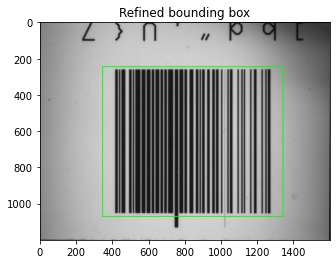

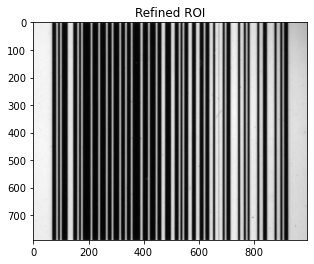

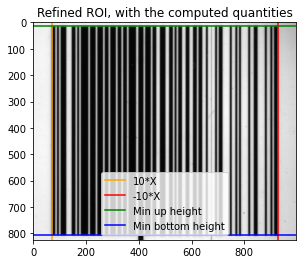

In [9]:
%%time
t = refine_roi(f'../images/{images_paths[0]}')
times.append(t)

Time for detecting the ROI: 0.0817570686340332
Time for rotating the image and the ROI: 0.0640263557434082
Time for computing the ROI quantities: 0.2066028118133545
Time for refining the ROI: 0.1266942024230957
Overall time: 0.4790804386138916
Wall time: 479 ms


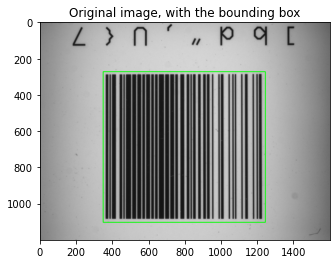

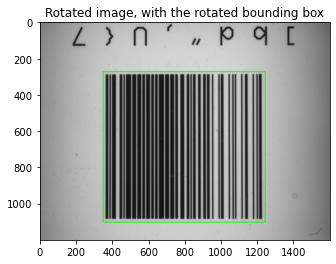

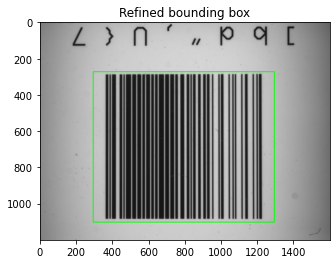

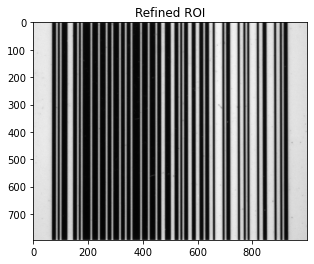

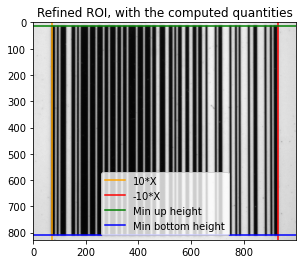

In [10]:
%%time
t = refine_roi(f'../images/{images_paths[1]}')
times.append(t)

Time for detecting the ROI: 0.05469465255737305
Time for rotating the image and the ROI: 0.048091888427734375
Time for computing the ROI quantities: 0.11007428169250488
Time for refining the ROI: 0.07064294815063477
Overall time: 0.28350377082824707
Wall time: 284 ms


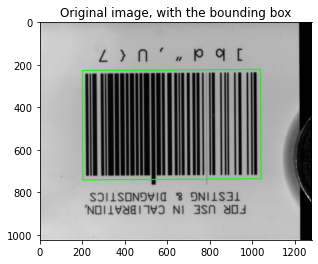

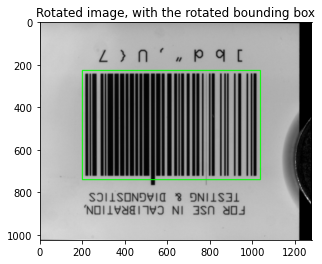

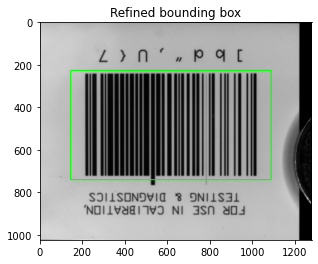

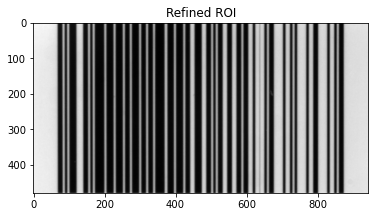

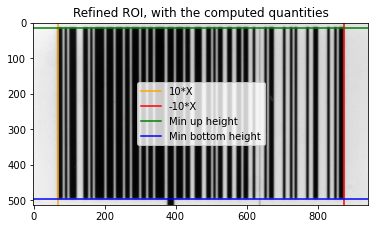

In [11]:
%%time
t = refine_roi(f'../images/{images_paths[2]}')
times.append(t)

Time for detecting the ROI: 0.05810379981994629
Time for rotating the image and the ROI: 0.035733938217163086
Time for computing the ROI quantities: 0.10963320732116699
Time for refining the ROI: 0.11499238014221191
Overall time: 0.3184633255004883
Wall time: 318 ms


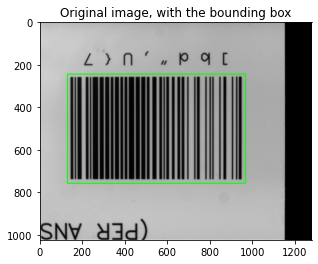

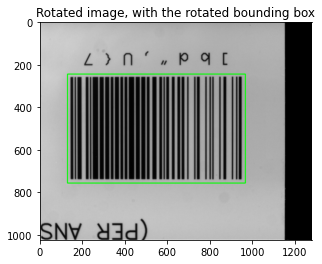

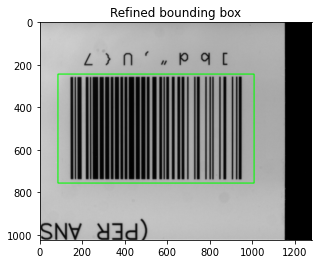

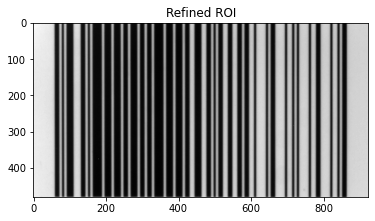

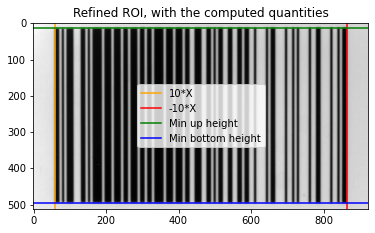

In [12]:
%%time
t = refine_roi(f'../images/{images_paths[3]}')
times.append(t)

Time for detecting the ROI: 0.058954477310180664
Time for rotating the image and the ROI: 0.04771924018859863
Time for computing the ROI quantities: 0.19618654251098633
Time for refining the ROI: 0.07459378242492676
Overall time: 0.3774540424346924
Wall time: 377 ms


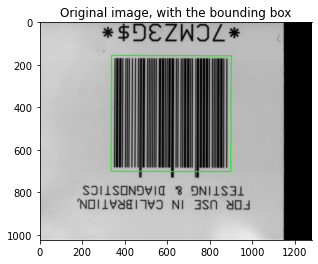

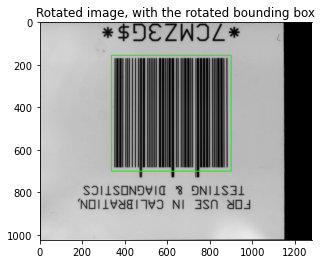

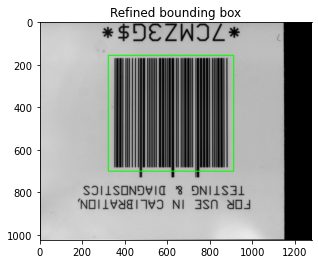

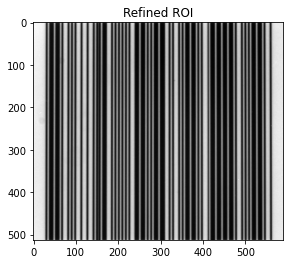

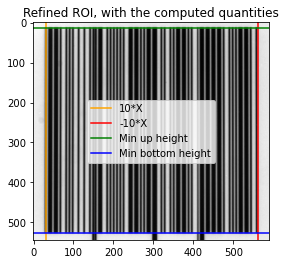

In [13]:
%%time
t = refine_roi(f'../images/{images_paths[4]}')
times.append(t)

Time for detecting the ROI: 0.07334160804748535
Time for rotating the image and the ROI: 0.04956793785095215
Time for computing the ROI quantities: 0.173980712890625
Time for refining the ROI: 0.06753015518188477
Overall time: 0.36442041397094727
Wall time: 364 ms


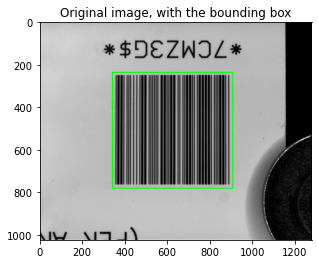

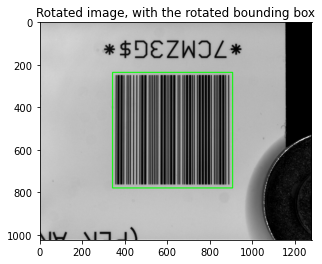

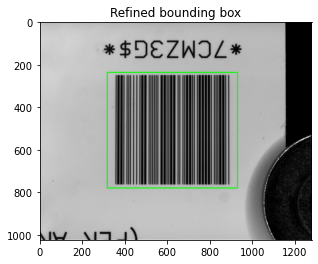

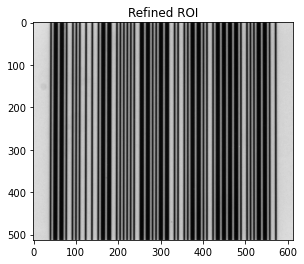

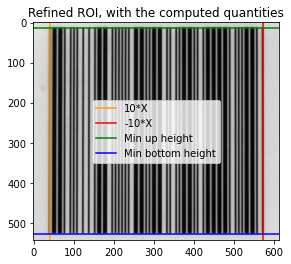

In [14]:
%%time
t = refine_roi(f'../images/{images_paths[5]}')
times.append(t)

Time for detecting the ROI: 0.05644083023071289
Time for rotating the image and the ROI: 0.04159998893737793
Time for computing the ROI quantities: 0.1440284252166748
Time for refining the ROI: 0.07039976119995117
Overall time: 0.3124690055847168
Wall time: 312 ms


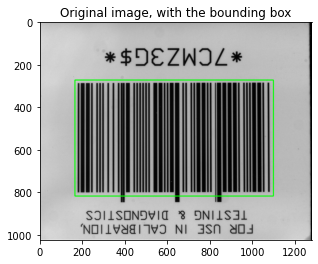

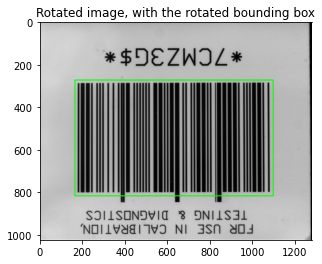

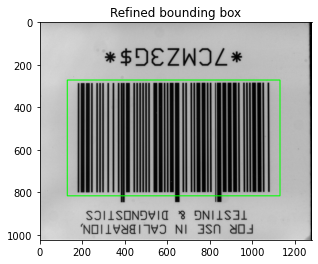

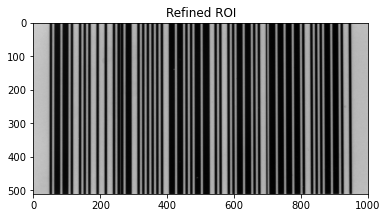

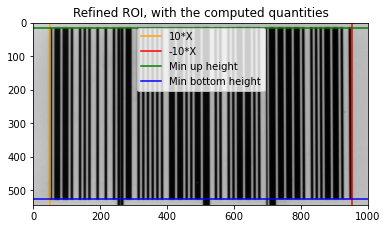

In [15]:
%%time
t = refine_roi(f'../images/{images_paths[6]}')
times.append(t)

Time for detecting the ROI: 0.10063838958740234
Time for rotating the image and the ROI: 0.04387474060058594
Time for computing the ROI quantities: 0.17913269996643066
Time for refining the ROI: 0.06325340270996094
Overall time: 0.3868992328643799
Wall time: 387 ms


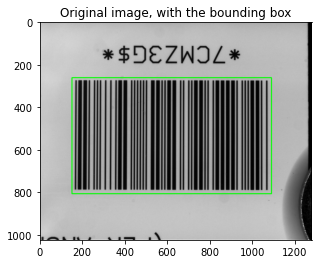

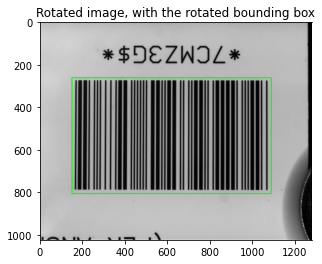

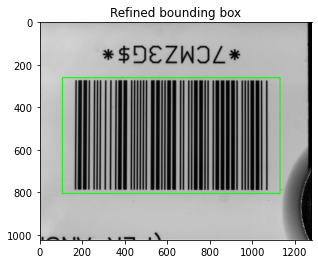

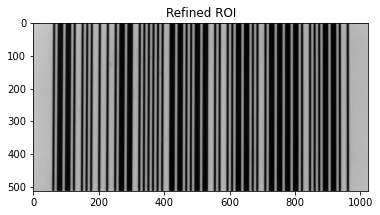

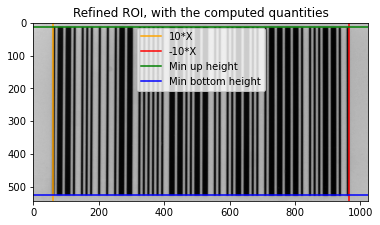

In [16]:
%%time
t = refine_roi(f'../images/{images_paths[7]}')
times.append(t)

Time for detecting the ROI: 0.06029486656188965
Time for rotating the image and the ROI: 0.04696297645568848
Time for computing the ROI quantities: 0.11600470542907715
Time for refining the ROI: 0.0890500545501709
Overall time: 0.31231260299682617
Wall time: 312 ms


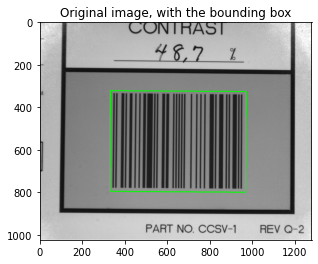

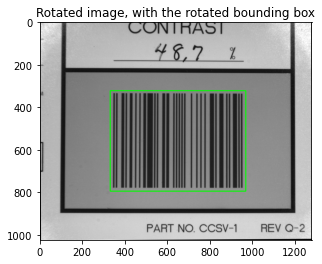

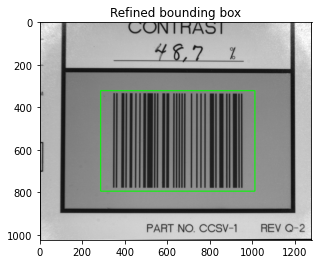

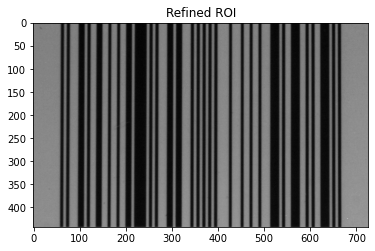

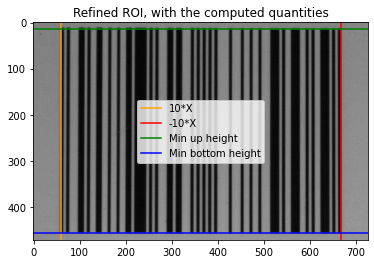

In [17]:
%%time
t = refine_roi(f'../images/{images_paths[8]}')
times.append(t)

Time for detecting the ROI: 0.06218552589416504
Time for rotating the image and the ROI: 0.03992915153503418
Time for computing the ROI quantities: 0.08465337753295898
Time for refining the ROI: 0.08307290077209473
Overall time: 0.26984095573425293
Wall time: 270 ms


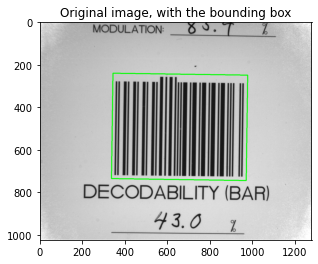

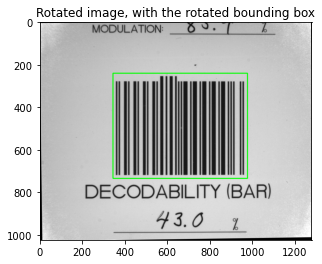

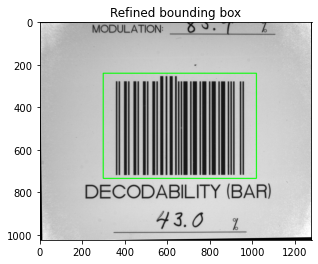

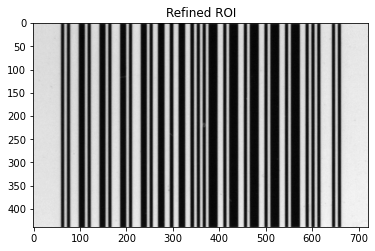

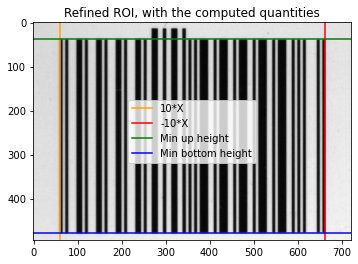

In [18]:
%%time
t = refine_roi(f'../images/{images_paths[9]}')
times.append(t)

In [19]:
"""%%time
t = refine_roi(f'../images/{images_paths[10]}')
times.append(t)"""

"%%time\nt = refine_roi(f'../images/{images_paths[10]}')\ntimes.append(t)"

Time for detecting the ROI: 0.0766897201538086
Time for rotating the image and the ROI: 0.04972195625305176
Time for computing the ROI quantities: 0.11213827133178711
Time for refining the ROI: 0.06577181816101074
Overall time: 0.3043217658996582
Wall time: 304 ms


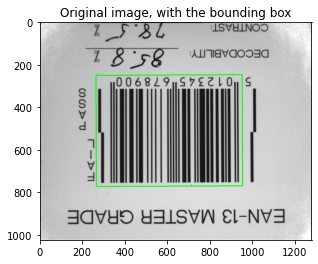

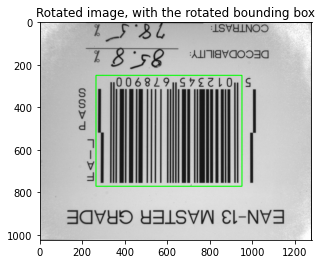

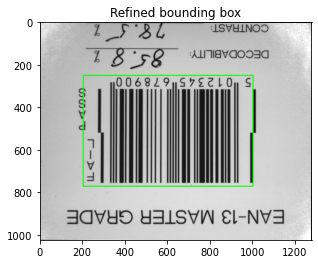

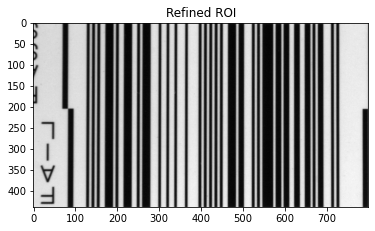

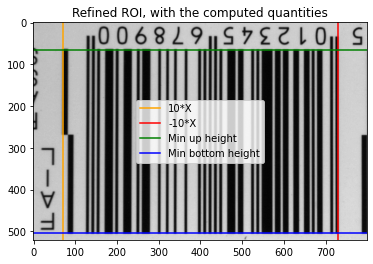

In [20]:
%%time
t = refine_roi(f'../images/{images_paths[11]}')
times.append(t)

In [21]:
"""%%time
t = refine_roi(f'../images/{images_paths[12]}')
times.append(t)"""

"%%time\nt = refine_roi(f'../images/{images_paths[12]}')\ntimes.append(t)"

Time for detecting the ROI: 0.039298057556152344
Time for rotating the image and the ROI: 0.032476186752319336
Time for computing the ROI quantities: 0.06300067901611328
Time for refining the ROI: 0.04686856269836426
Overall time: 0.18164348602294922
Wall time: 182 ms


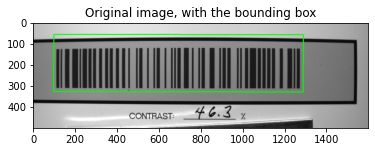

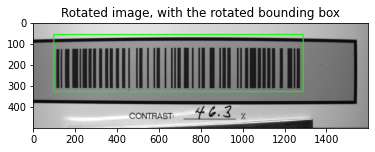

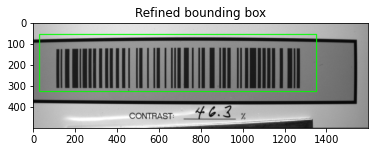

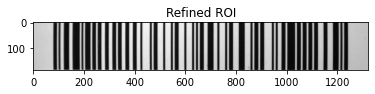

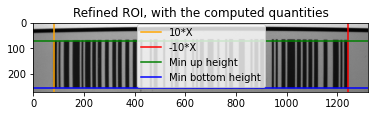

In [22]:
%%time
t = refine_roi(f'../images/{images_paths[13]}')
times.append(t)

Time for detecting the ROI: 0.07004880905151367
Time for rotating the image and the ROI: 0.0240170955657959
Time for computing the ROI quantities: 0.062479257583618164
Time for refining the ROI: 0.06249403953552246
Overall time: 0.2190392017364502
Wall time: 219 ms


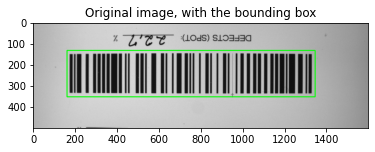

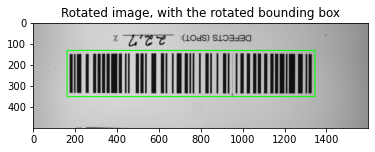

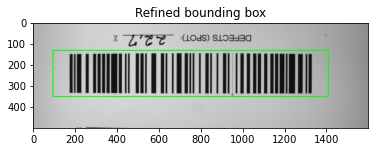

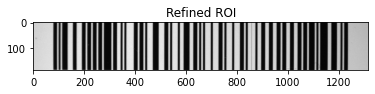

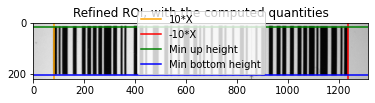

In [23]:
%%time
t = refine_roi(f'../images/{images_paths[14]}')
times.append(t)

Time for detecting the ROI: 0.04255557060241699
Time for rotating the image and the ROI: 0.032488346099853516
Time for computing the ROI quantities: 0.07906436920166016
Time for refining the ROI: 0.06259393692016602
Overall time: 0.21670222282409668
Wall time: 217 ms


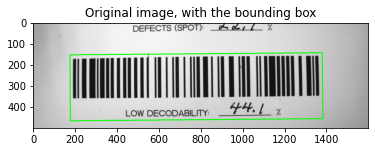

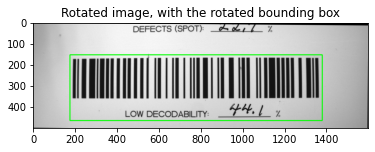

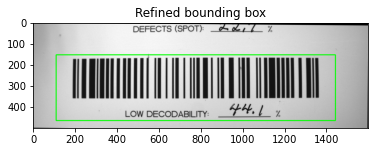

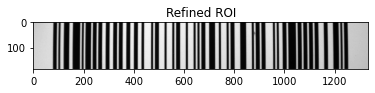

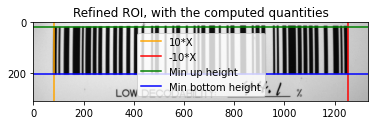

In [24]:
%%time
t = refine_roi(f'../images/{images_paths[15]}')
times.append(t)

Time for detecting the ROI: 0.0557551383972168
Time for rotating the image and the ROI: 0.0320439338684082
Time for computing the ROI quantities: 0.05536651611328125
Time for refining the ROI: 0.09496068954467773
Overall time: 0.23812627792358398
Wall time: 238 ms


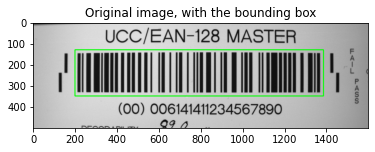

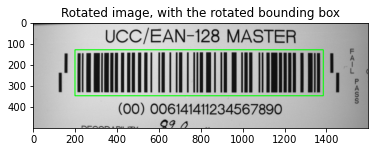

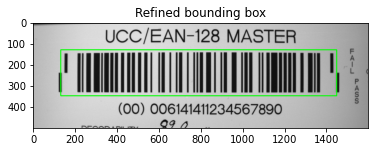

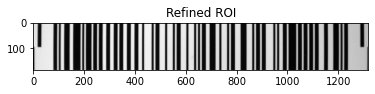

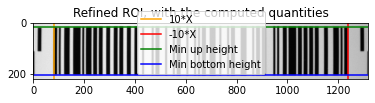

In [25]:
%%time
t = refine_roi(f'../images/{images_paths[16]}')
times.append(t)

Time for detecting the ROI: 0.042143821716308594
Time for rotating the image and the ROI: 0.03969860076904297
Time for computing the ROI quantities: 0.0711219310760498
Time for refining the ROI: 0.05556964874267578
Overall time: 0.20853400230407715
Wall time: 209 ms


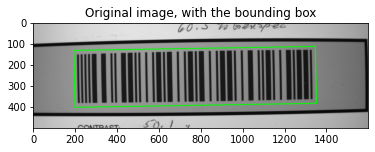

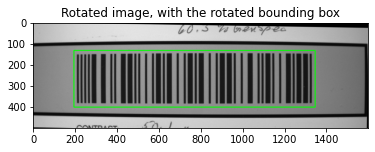

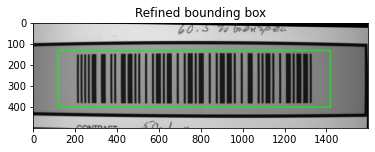

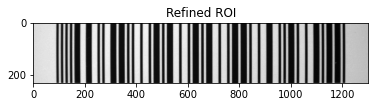

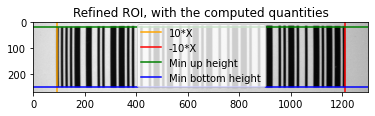

In [26]:
%%time
t = refine_roi(f'../images/{images_paths[17]}')
times.append(t)

In [27]:
f'../images/{images_paths[18]}'

'../images/I25-DEFECTS IMGB.BMP'

Time for detecting the ROI: 0.04136037826538086
Time for rotating the image and the ROI: 0.03038954734802246
Time for computing the ROI quantities: 0.06259298324584961
Time for refining the ROI: 0.06263065338134766
Overall time: 0.19697356224060059
Wall time: 197 ms


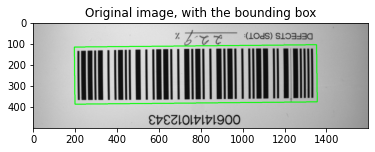

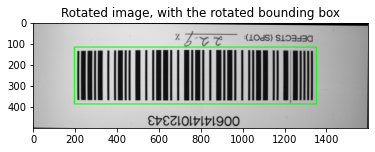

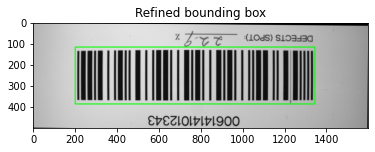

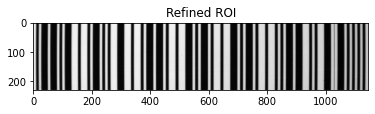

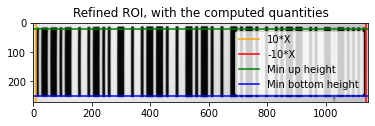

In [28]:
%%time
t = refine_roi(f'../images/{images_paths[18]}')
times.append(t)

Time for detecting the ROI: 0.03988218307495117
Time for rotating the image and the ROI: 0.03211688995361328
Time for computing the ROI quantities: 0.09373641014099121
Time for refining the ROI: 0.06249380111694336
Overall time: 0.22822928428649902
Wall time: 228 ms


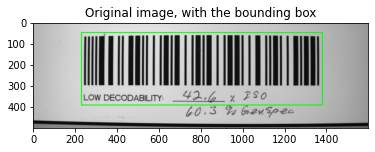

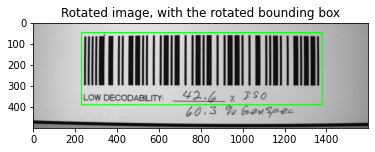

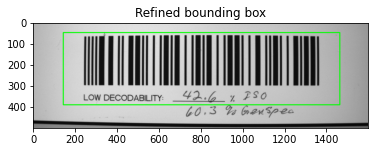

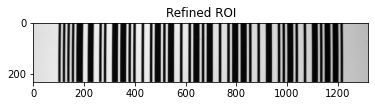

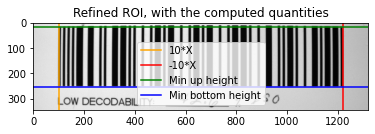

In [29]:
%%time
t = refine_roi(f'../images/{images_paths[19]}')
times.append(t)

Time for detecting the ROI: 0.07268142700195312
Time for rotating the image and the ROI: 0.03171396255493164
Time for computing the ROI quantities: 0.07821512222290039
Time for refining the ROI: 0.04687142372131348
Overall time: 0.22948193550109863
Wall time: 229 ms


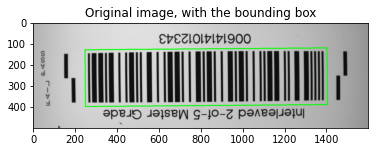

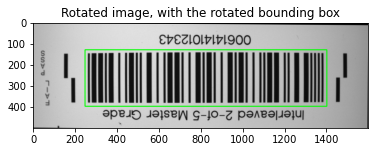

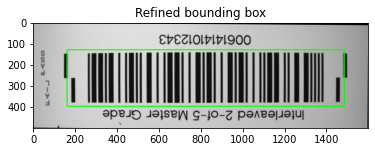

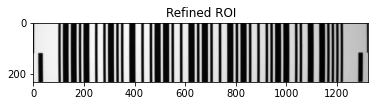

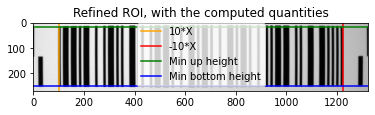

In [30]:
%%time
t = refine_roi(f'../images/{images_paths[20]}')
times.append(t)

Time for detecting the ROI: 0.06601572036743164
Time for rotating the image and the ROI: 0.04140353202819824
Time for computing the ROI quantities: 0.1253950595855713
Time for refining the ROI: 0.08260107040405273
Overall time: 0.3154153823852539
Wall time: 323 ms


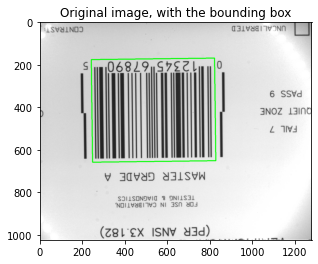

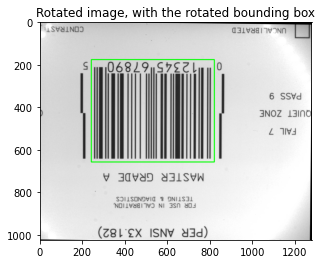

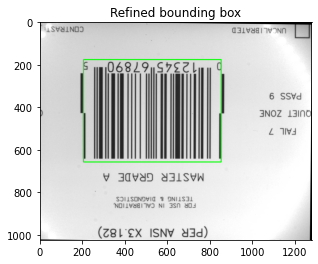

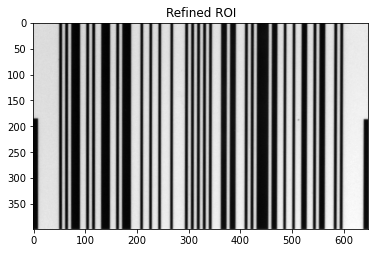

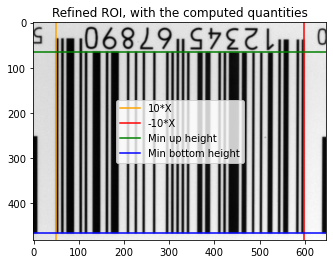

In [31]:
%%time
t = refine_roi(f'../images/{images_paths[22]}')
times.append(t)

Time for detecting the ROI: 0.05956459045410156
Time for rotating the image and the ROI: 0.048126935958862305
Time for computing the ROI quantities: 0.13001155853271484
Time for refining the ROI: 0.08031749725341797
Overall time: 0.3180205821990967
Wall time: 318 ms


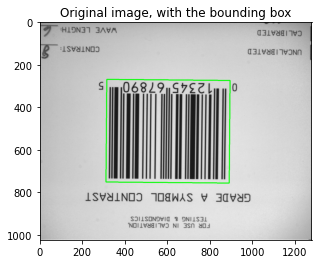

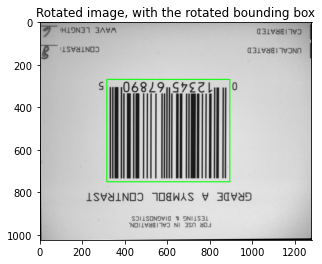

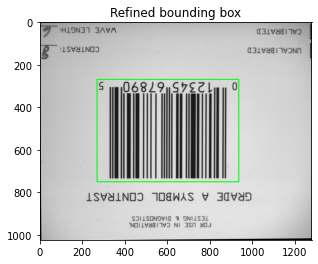

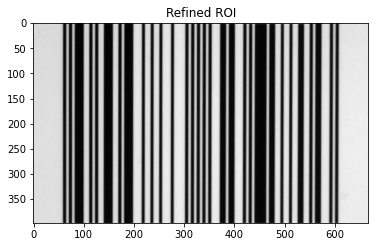

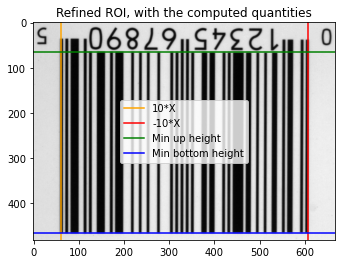

In [32]:
%%time
t = refine_roi(f'../images/{images_paths[23]}')
times.append(t)

Time for detecting the ROI: 0.07143402099609375
Time for rotating the image and the ROI: 0.05320906639099121
Time for computing the ROI quantities: 0.0976407527923584
Time for refining the ROI: 0.0672142505645752
Overall time: 0.28949809074401855
Wall time: 289 ms


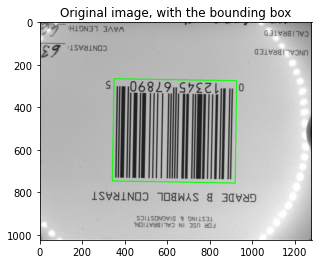

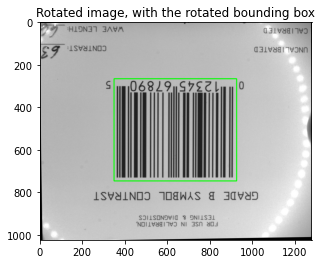

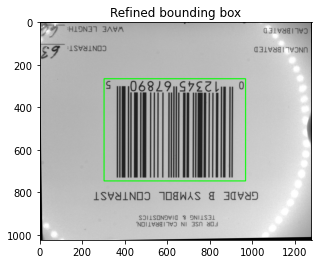

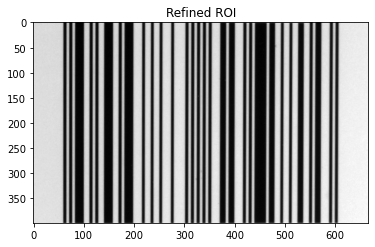

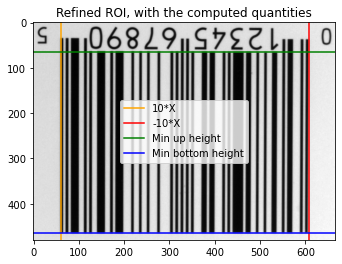

In [33]:
%%time
t = refine_roi(f'../images/{images_paths[24]}')
times.append(t)

Time for detecting the ROI: 0.05817914009094238
Time for rotating the image and the ROI: 0.047067880630493164
Time for computing the ROI quantities: 0.08179807662963867
Time for refining the ROI: 0.0866239070892334
Overall time: 0.2736690044403076
Wall time: 274 ms


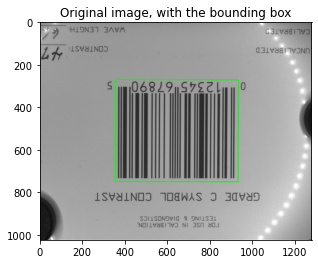

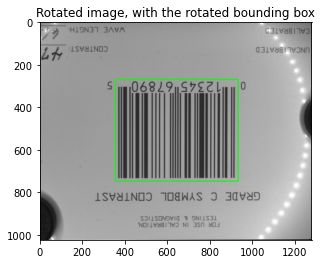

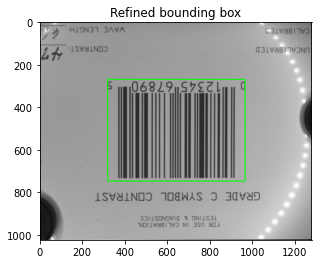

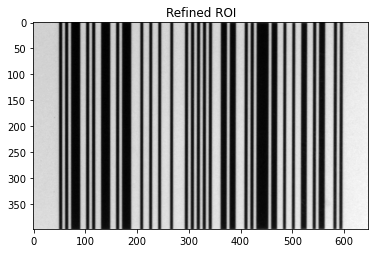

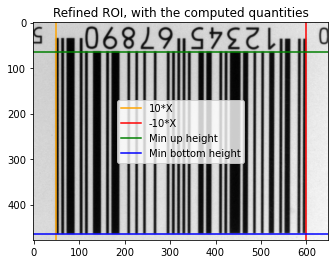

In [34]:
%%time
t = refine_roi(f'../images/{images_paths[25]}')
times.append(t)

Time for detecting the ROI: 0.05617666244506836
Time for rotating the image and the ROI: 0.04756331443786621
Time for computing the ROI quantities: 0.09365463256835938
Time for refining the ROI: 0.07088780403137207
Overall time: 0.268282413482666
Wall time: 268 ms


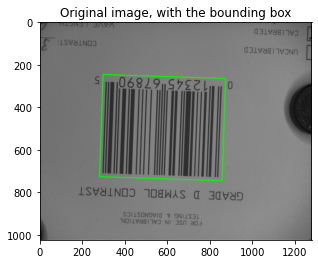

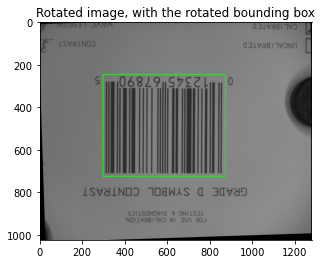

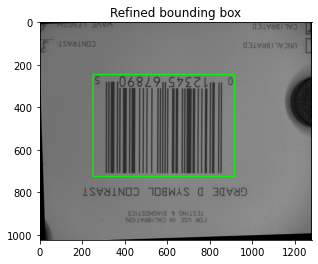

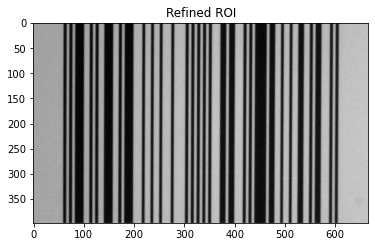

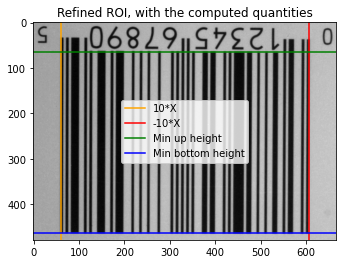

In [35]:
%%time
t = refine_roi(f'../images/{images_paths[26]}')
times.append(t)

Time for detecting the ROI: 0.057735443115234375
Time for rotating the image and the ROI: 0.03223085403442383
Time for computing the ROI quantities: 0.0781855583190918
Time for refining the ROI: 0.06540107727050781
Overall time: 0.2335529327392578
Wall time: 234 ms


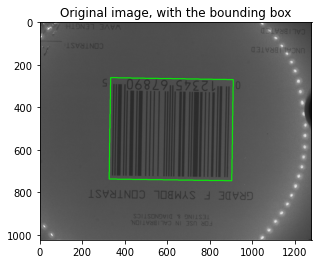

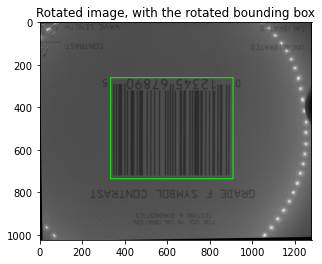

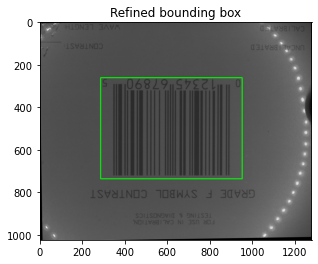

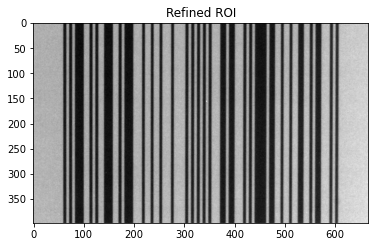

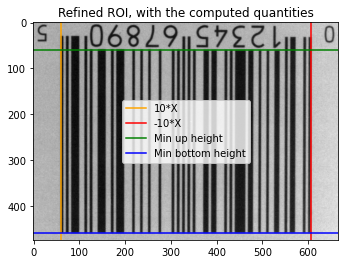

In [36]:
%%time
t = refine_roi(f'../images/{images_paths[27]}')
times.append(t)

Time for detecting the ROI: 0.0858316421508789
Time for rotating the image and the ROI: 0.0475764274597168
Time for computing the ROI quantities: 0.09488034248352051
Time for refining the ROI: 0.16024184226989746
Overall time: 0.38853025436401367
Wall time: 389 ms


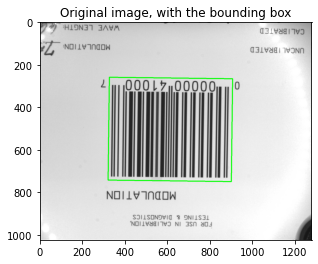

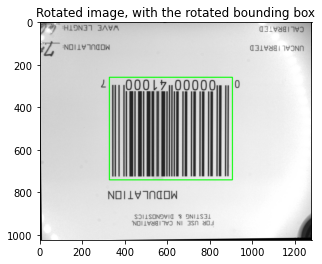

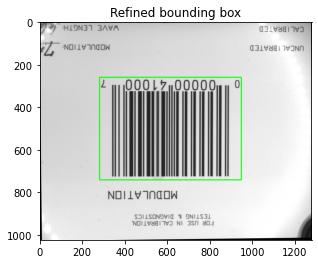

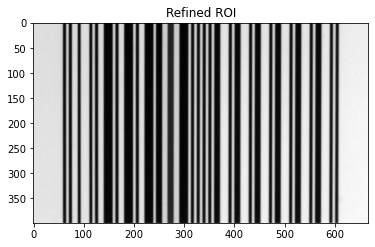

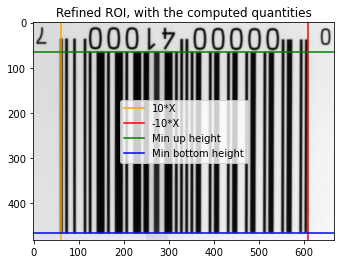

In [37]:
%%time
t = refine_roi(f'../images/{images_paths[28]}')
times.append(t)

Time for detecting the ROI: 0.066253662109375
Time for rotating the image and the ROI: 0.03927755355834961
Time for computing the ROI quantities: 0.10974526405334473
Time for refining the ROI: 0.07392358779907227
Overall time: 0.2892000675201416
Wall time: 289 ms


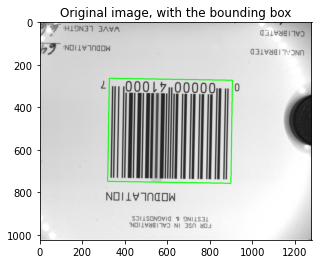

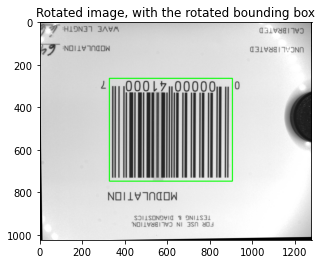

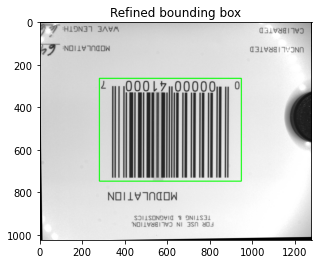

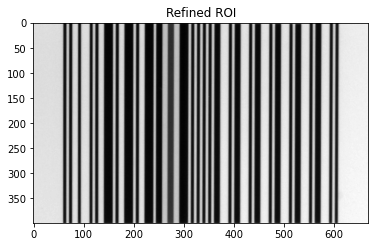

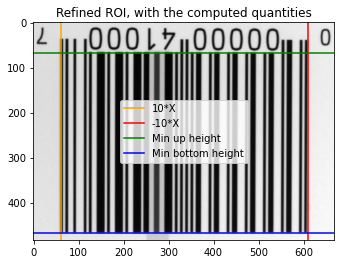

In [38]:
%%time
t = refine_roi(f'../images/{images_paths[29]}')
times.append(t)

Time for detecting the ROI: 0.06708073616027832
Time for rotating the image and the ROI: 0.0401005744934082
Time for computing the ROI quantities: 0.078338623046875
Time for refining the ROI: 0.0733799934387207
Overall time: 0.2588999271392822
Wall time: 259 ms


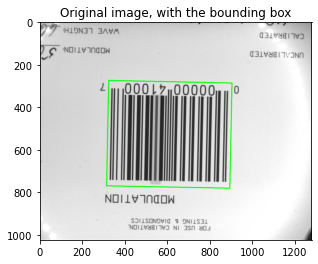

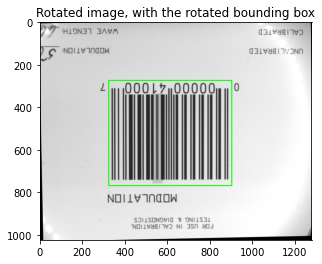

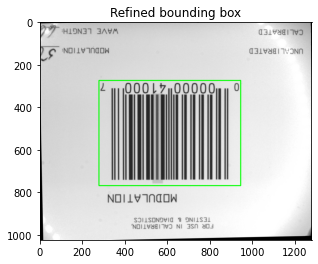

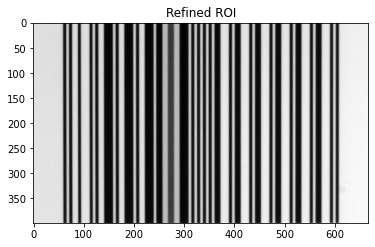

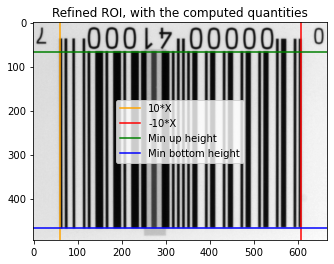

In [39]:
%%time
t = refine_roi(f'../images/{images_paths[30]}')
times.append(t)

Time for detecting the ROI: 0.08089113235473633
Time for rotating the image and the ROI: 0.051741838455200195
Time for computing the ROI quantities: 0.10622692108154297
Time for refining the ROI: 0.08048748970031738
Overall time: 0.3193473815917969
Wall time: 319 ms


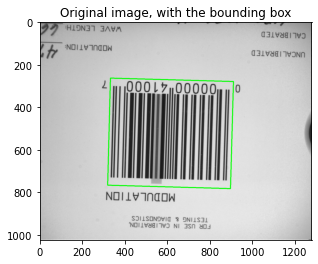

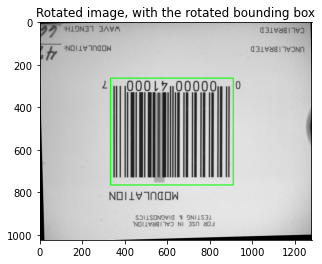

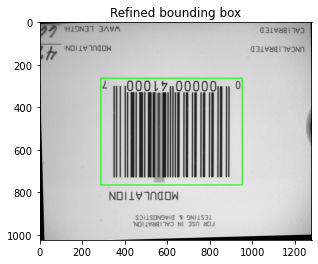

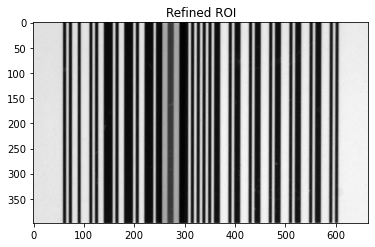

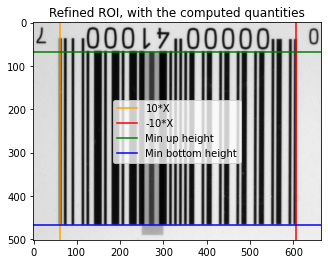

In [40]:
%%time
t = refine_roi(f'../images/{images_paths[31]}')
times.append(t)

Time for detecting the ROI: 0.10305476188659668
Time for rotating the image and the ROI: 0.05105447769165039
Time for computing the ROI quantities: 0.1080935001373291
Time for refining the ROI: 0.07659006118774414
Overall time: 0.3387928009033203
Wall time: 347 ms


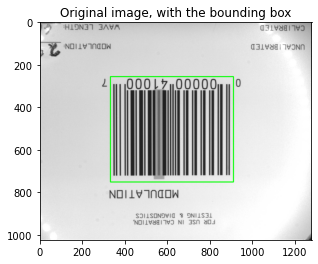

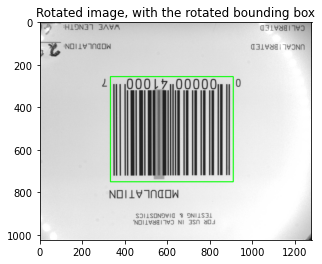

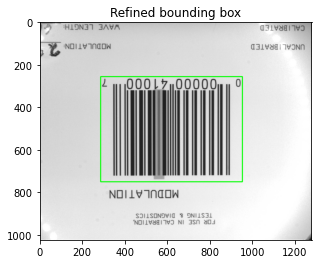

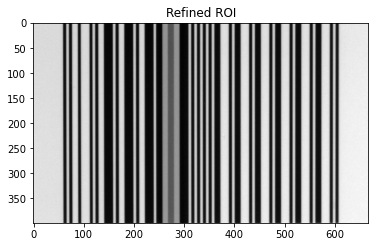

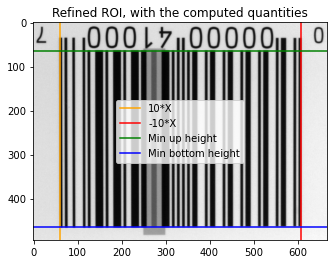

In [41]:
%%time
t = refine_roi(f'../images/{images_paths[32]}')
times.append(t)

Time for detecting the ROI: 0.05565023422241211
Time for rotating the image and the ROI: 0.04958677291870117
Time for computing the ROI quantities: 0.09365272521972656
Time for refining the ROI: 0.08374238014221191
Overall time: 0.28263211250305176
Wall time: 283 ms


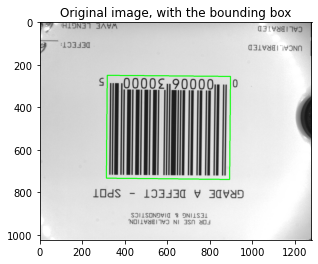

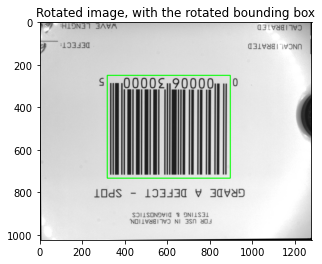

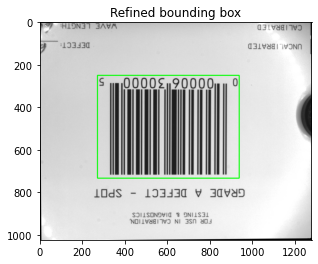

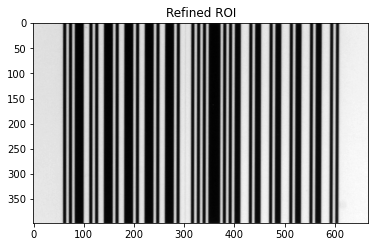

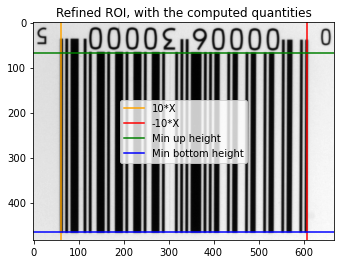

In [42]:
%%time
t = refine_roi(f'../images/{images_paths[33]}')
times.append(t)

Time for detecting the ROI: 0.06333208084106445
Time for rotating the image and the ROI: 0.03401684761047363
Time for computing the ROI quantities: 0.09366965293884277
Time for refining the ROI: 0.06249594688415527
Overall time: 0.25351452827453613
Wall time: 254 ms


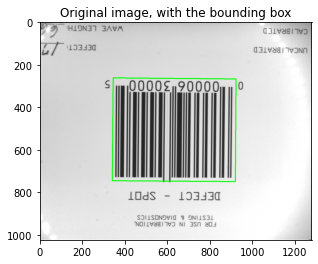

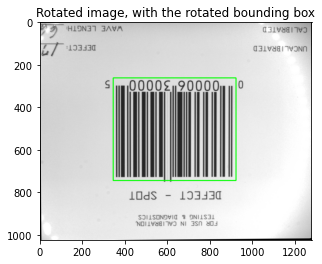

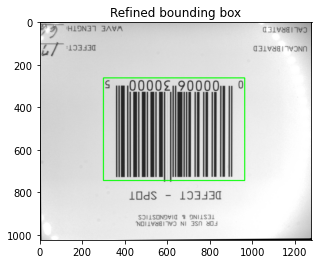

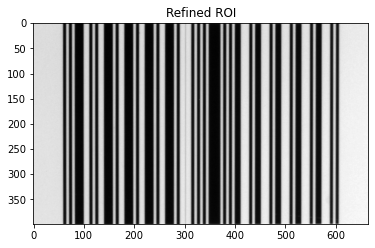

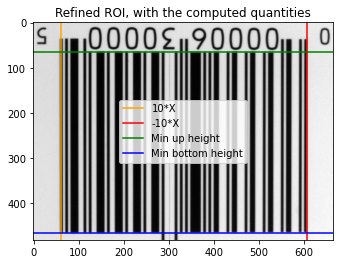

In [43]:
%%time
t = refine_roi(f'../images/{images_paths[34]}')
times.append(t)

Time for detecting the ROI: 0.07954192161560059
Time for rotating the image and the ROI: 0.04073309898376465
Time for computing the ROI quantities: 0.09399223327636719
Time for refining the ROI: 0.06715059280395508
Overall time: 0.2814178466796875
Wall time: 281 ms


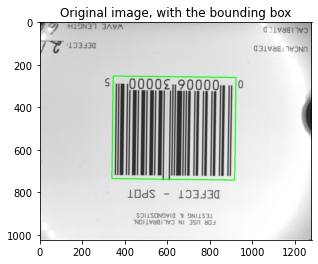

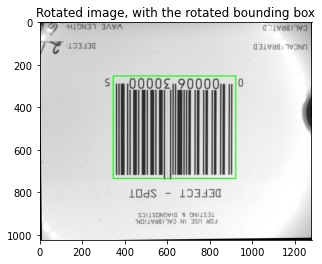

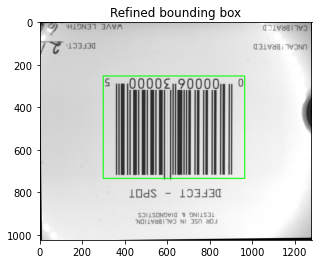

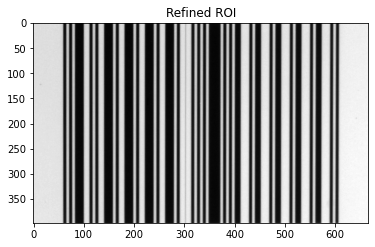

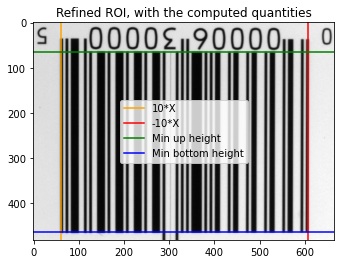

In [44]:
%%time
t = refine_roi(f'../images/{images_paths[35]}')
times.append(t)

Time for detecting the ROI: 0.05615997314453125
Time for rotating the image and the ROI: 0.03207087516784668
Time for computing the ROI quantities: 0.08620691299438477
Time for refining the ROI: 0.07908153533935547
Overall time: 0.25351929664611816
Wall time: 254 ms


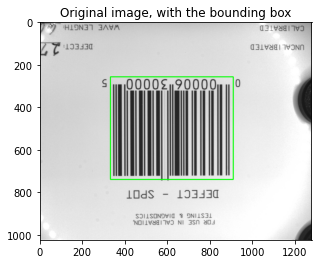

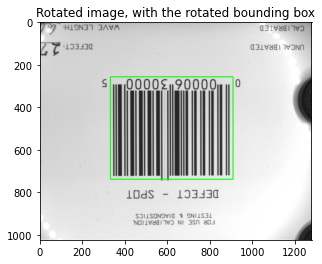

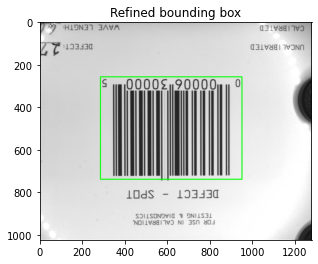

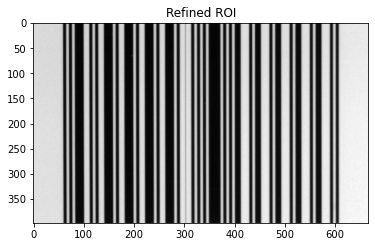

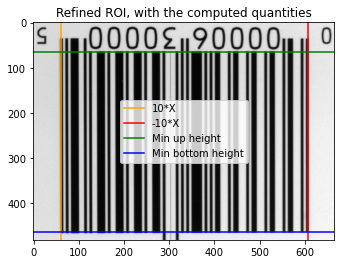

In [45]:
%%time
t = refine_roi(f'../images/{images_paths[36]}')
times.append(t)

Time for detecting the ROI: 0.06537985801696777
Time for rotating the image and the ROI: 0.03932046890258789
Time for computing the ROI quantities: 0.09541726112365723
Time for refining the ROI: 0.06916165351867676
Overall time: 0.26927924156188965
Wall time: 269 ms


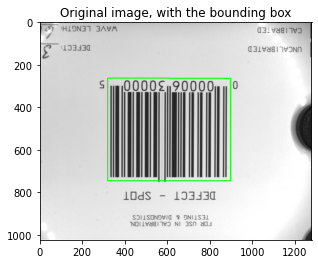

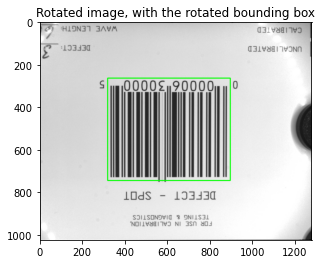

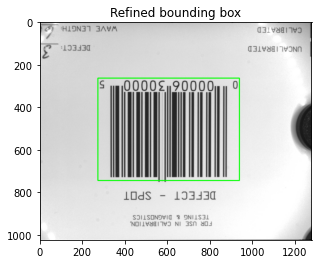

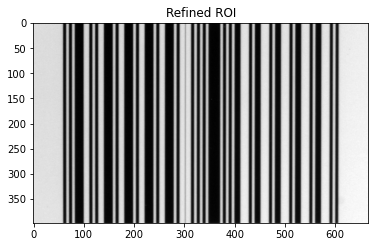

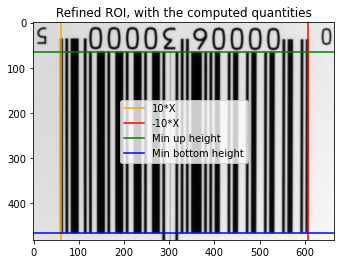

In [46]:
%%time
t = refine_roi(f'../images/{images_paths[37]}')
times.append(t)

Time for detecting the ROI: 0.06738162040710449
Time for rotating the image and the ROI: 0.0549163818359375
Time for computing the ROI quantities: 0.09366321563720703
Time for refining the ROI: 0.07822370529174805
Overall time: 0.29418492317199707
Wall time: 295 ms


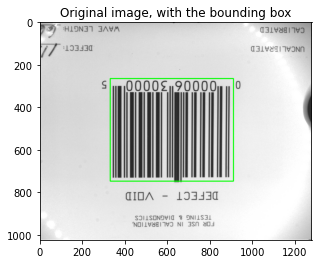

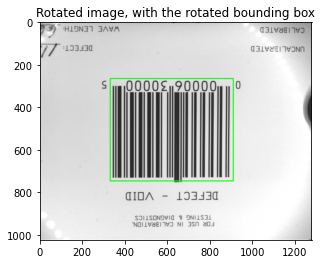

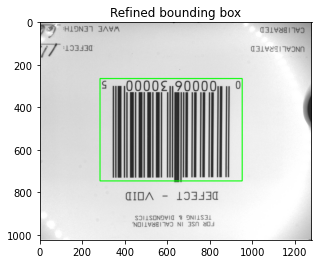

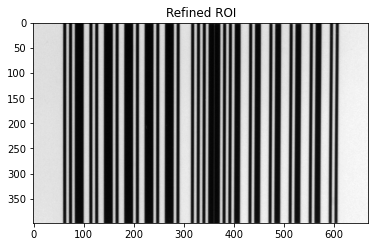

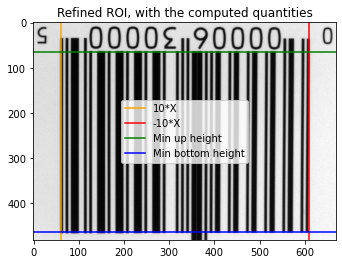

In [47]:
%%time
t = refine_roi(f'../images/{images_paths[38]}')
times.append(t)

Time for detecting the ROI: 0.0644230842590332
Time for rotating the image and the ROI: 0.046661376953125
Time for computing the ROI quantities: 0.09389090538024902
Time for refining the ROI: 0.1118919849395752
Overall time: 0.3168673515319824
Wall time: 325 ms


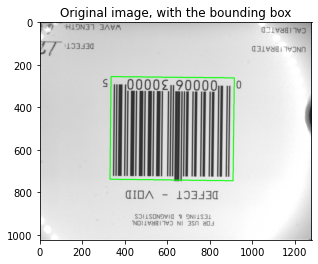

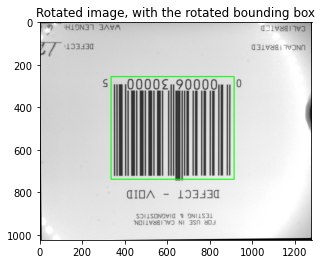

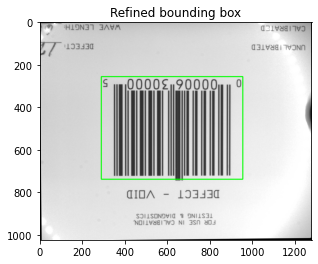

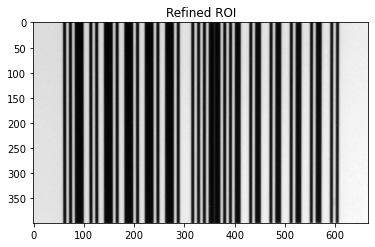

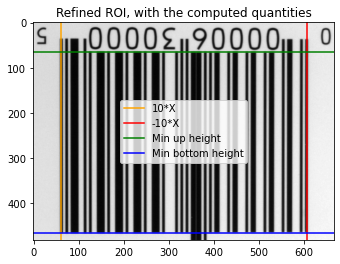

In [48]:
%%time
t = refine_roi(f'../images/{images_paths[39]}')
times.append(t)

Time for detecting the ROI: 0.05891752243041992
Time for rotating the image and the ROI: 0.04889988899230957
Time for computing the ROI quantities: 0.09777641296386719
Time for refining the ROI: 0.05856490135192871
Overall time: 0.2641587257385254
Wall time: 264 ms


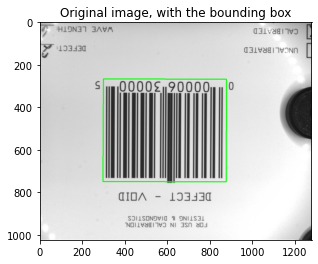

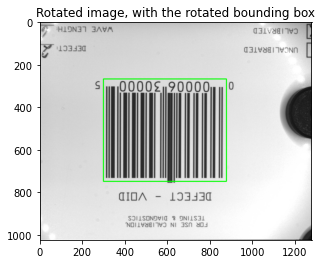

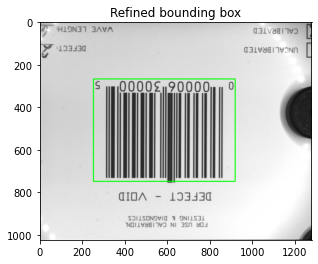

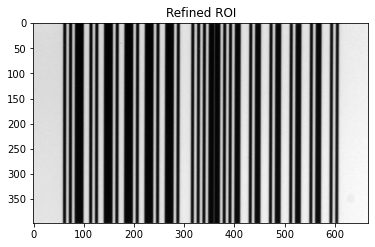

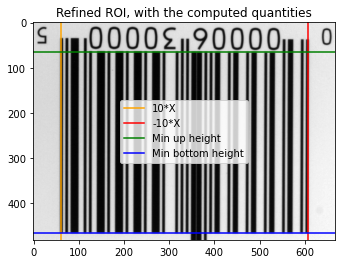

In [49]:
%%time
t = refine_roi(f'../images/{images_paths[40]}')
times.append(t)

Time for detecting the ROI: 0.07448983192443848
Time for rotating the image and the ROI: 0.04751276969909668
Time for computing the ROI quantities: 0.11049818992614746
Time for refining the ROI: 0.09196281433105469
Overall time: 0.3244636058807373
Wall time: 324 ms


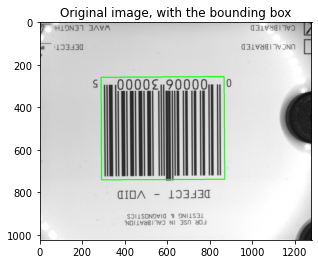

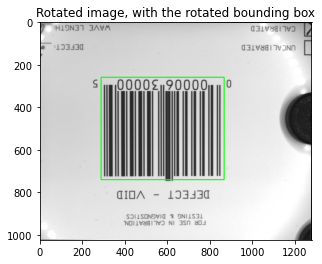

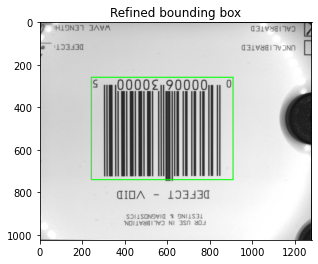

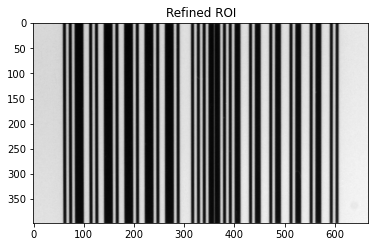

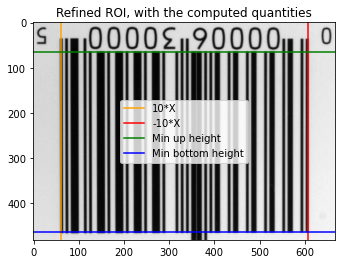

In [50]:
%%time
t = refine_roi(f'../images/{images_paths[41]}')
times.append(t)

Time for detecting the ROI: 0.05974435806274414
Time for rotating the image and the ROI: 0.043628692626953125
Time for computing the ROI quantities: 0.09621667861938477
Time for refining the ROI: 0.06154179573059082
Overall time: 0.26113152503967285
Wall time: 261 ms


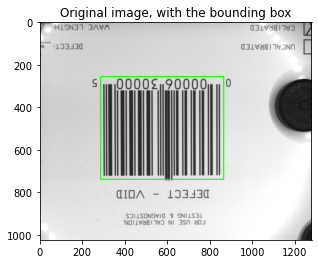

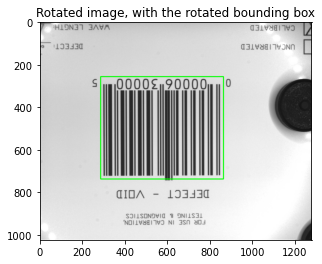

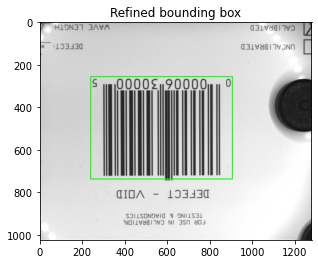

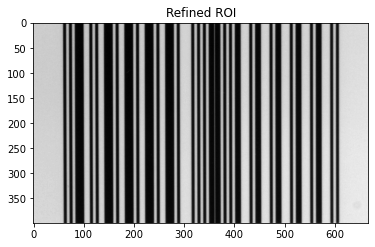

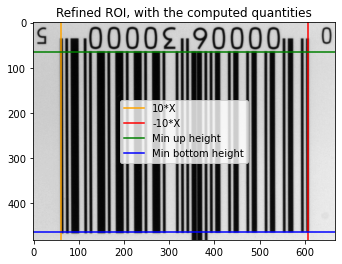

In [51]:
%%time
t = refine_roi(f'../images/{images_paths[42]}')
times.append(t)

Time for detecting the ROI: 0.10424923896789551
Time for rotating the image and the ROI: 0.04110264778137207
Time for computing the ROI quantities: 0.10762333869934082
Time for refining the ROI: 0.07080745697021484
Overall time: 0.32378268241882324
Wall time: 324 ms


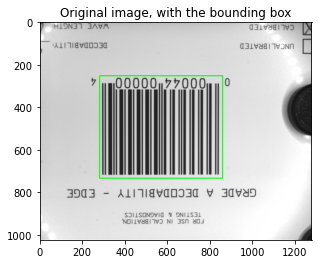

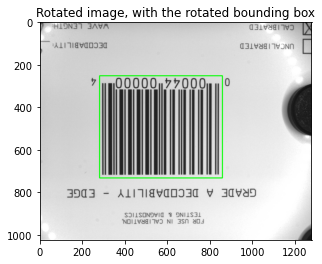

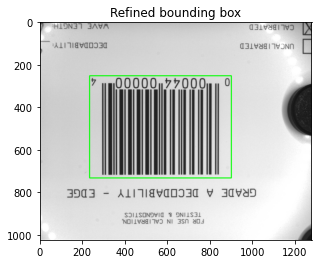

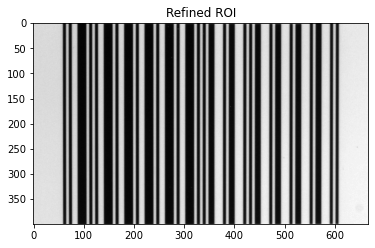

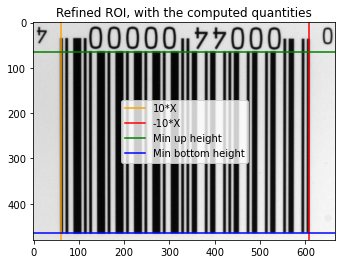

In [52]:
%%time
t = refine_roi(f'../images/{images_paths[43]}')
times.append(t)

Time for detecting the ROI: 0.05993223190307617
Time for rotating the image and the ROI: 0.03219461441040039
Time for computing the ROI quantities: 0.11028671264648438
Time for refining the ROI: 0.05953860282897949
Overall time: 0.26195216178894043
Wall time: 270 ms


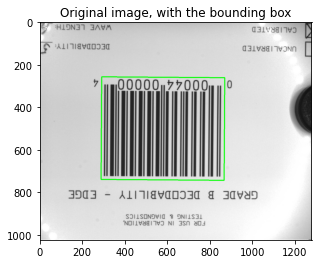

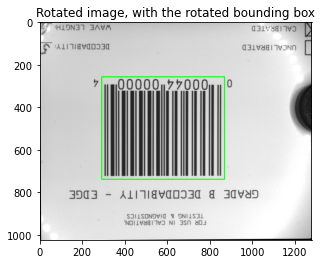

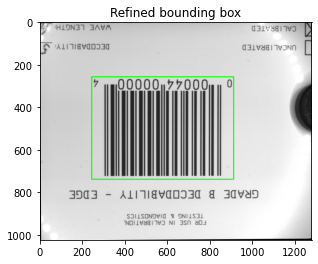

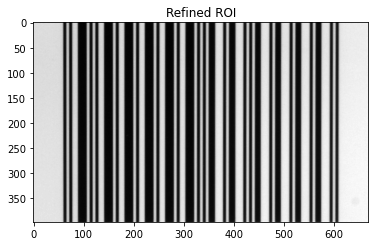

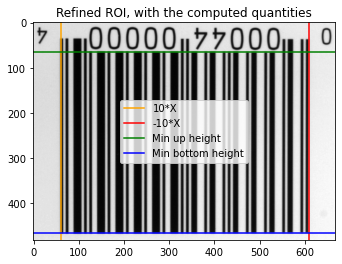

In [53]:
%%time
t = refine_roi(f'../images/{images_paths[44]}')
times.append(t)

Time for detecting the ROI: 0.06263470649719238
Time for rotating the image and the ROI: 0.03961610794067383
Time for computing the ROI quantities: 0.07333564758300781
Time for refining the ROI: 0.0630803108215332
Overall time: 0.23866677284240723
Wall time: 239 ms


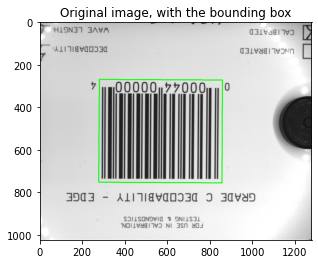

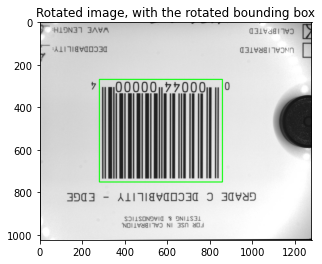

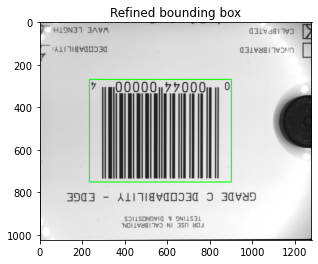

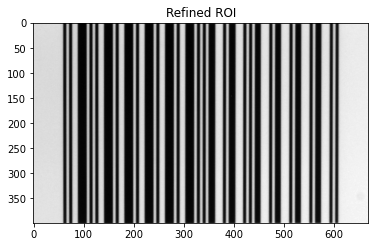

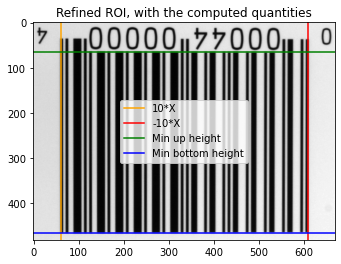

In [54]:
%%time
t = refine_roi(f'../images/{images_paths[45]}')
times.append(t)

Time for detecting the ROI: 0.057305335998535156
Time for rotating the image and the ROI: 0.05017709732055664
Time for computing the ROI quantities: 0.10060715675354004
Time for refining the ROI: 0.05758380889892578
Overall time: 0.2656733989715576
Wall time: 266 ms


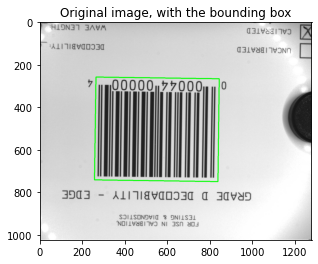

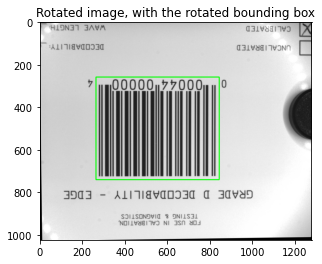

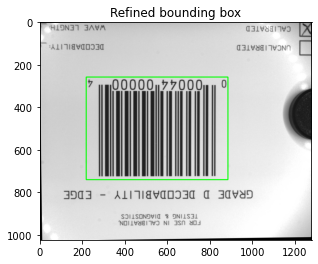

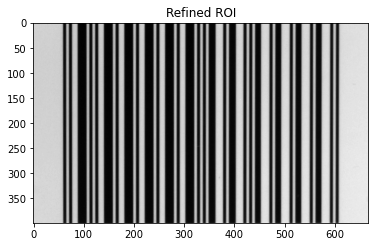

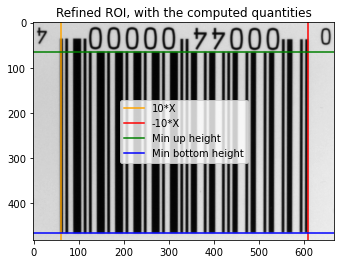

In [55]:
%%time
t = refine_roi(f'../images/{images_paths[46]}')
times.append(t)

Time for detecting the ROI: 0.06540226936340332
Time for rotating the image and the ROI: 0.039638519287109375
Time for computing the ROI quantities: 0.07811665534973145
Time for refining the ROI: 0.06768584251403809
Overall time: 0.2508432865142822
Wall time: 251 ms


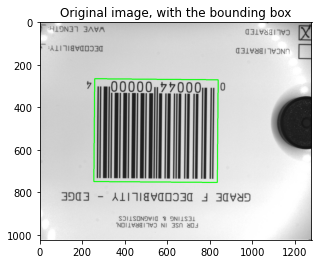

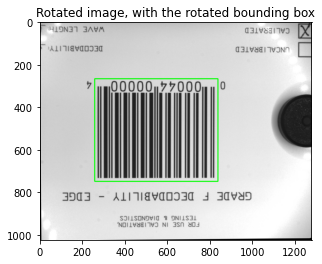

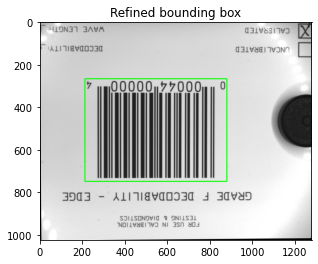

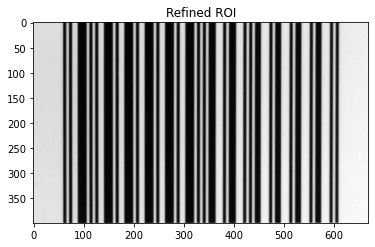

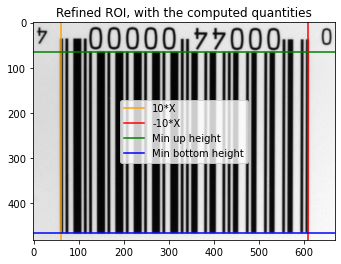

In [56]:
%%time
t = refine_roi(f'../images/{images_paths[47]}')
times.append(t)

Time for detecting the ROI: 0.05762338638305664
Time for rotating the image and the ROI: 0.048186540603637695
Time for computing the ROI quantities: 0.1180276870727539
Time for refining the ROI: 0.08194375038146973
Overall time: 0.30578136444091797
Wall time: 306 ms


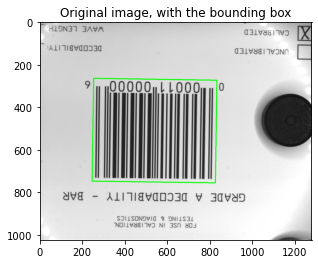

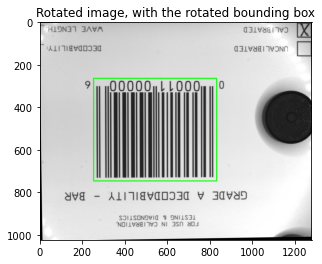

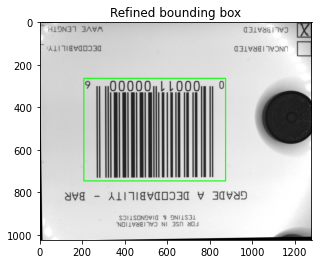

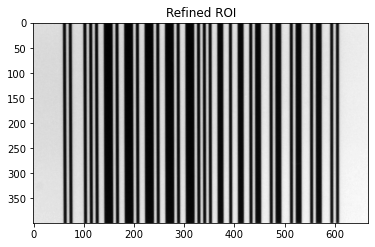

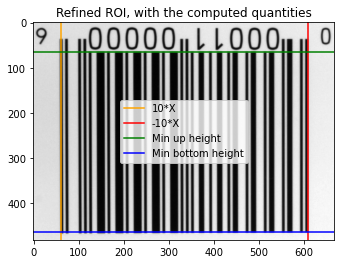

In [57]:
%%time
t = refine_roi(f'../images/{images_paths[48]}')
times.append(t)

Time for detecting the ROI: 0.06923317909240723
Time for rotating the image and the ROI: 0.0719916820526123
Time for computing the ROI quantities: 0.11774969100952148
Time for refining the ROI: 0.06568551063537598
Overall time: 0.324660062789917
Wall time: 325 ms


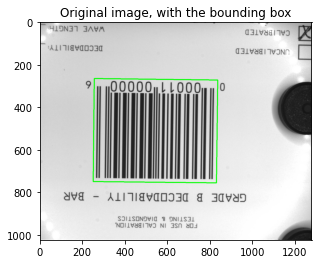

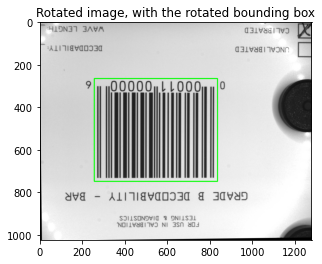

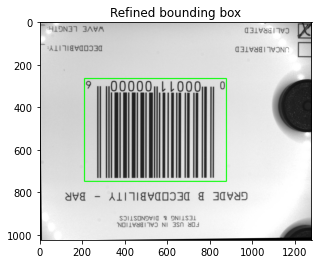

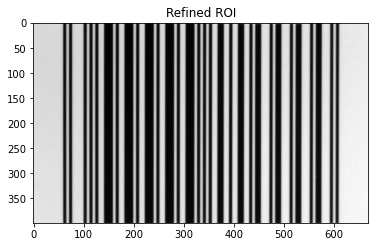

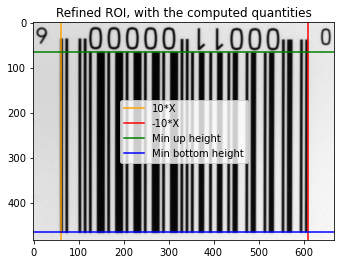

In [58]:
%%time
t = refine_roi(f'../images/{images_paths[49]}')
times.append(t)

Time for detecting the ROI: 0.05886030197143555
Time for rotating the image and the ROI: 0.038632869720458984
Time for computing the ROI quantities: 0.09621787071228027
Time for refining the ROI: 0.12847614288330078
Overall time: 0.3221871852874756
Wall time: 322 ms


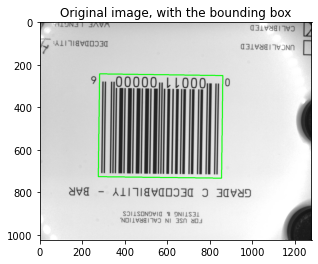

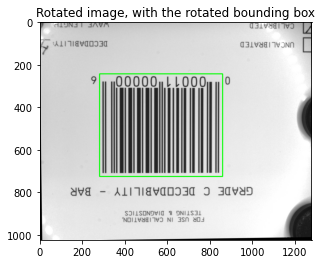

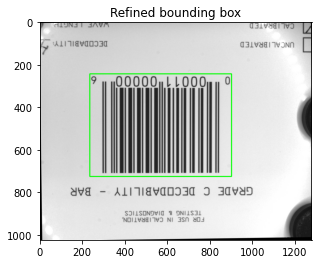

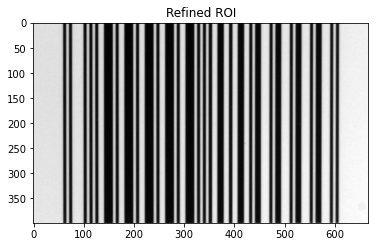

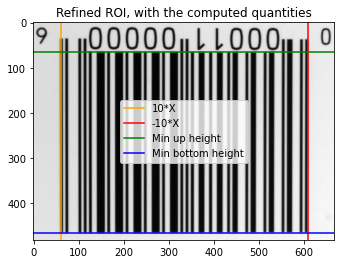

In [59]:
%%time
t = refine_roi(f'../images/{images_paths[50]}')
times.append(t)

Time for detecting the ROI: 0.05970573425292969
Time for rotating the image and the ROI: 0.0495603084564209
Time for computing the ROI quantities: 0.11779499053955078
Time for refining the ROI: 0.07347631454467773
Overall time: 0.3005373477935791
Wall time: 301 ms


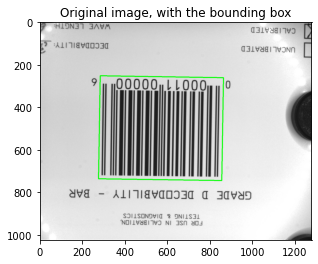

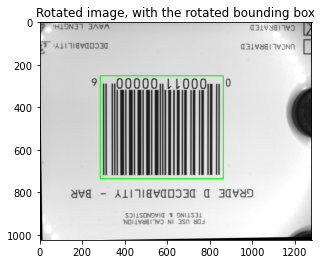

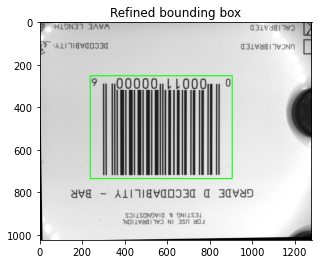

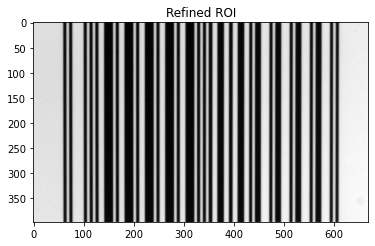

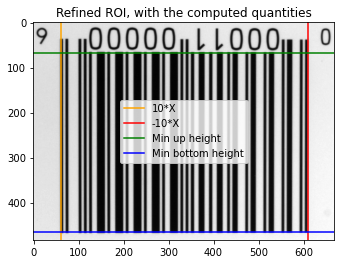

In [60]:
%%time
t = refine_roi(f'../images/{images_paths[51]}')
times.append(t)

Time for detecting the ROI: 0.05913519859313965
Time for rotating the image and the ROI: 0.03853869438171387
Time for computing the ROI quantities: 0.1052405834197998
Time for refining the ROI: 0.06912755966186523
Overall time: 0.27204203605651855
Wall time: 272 ms


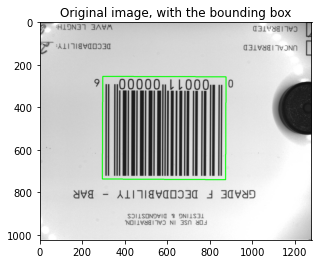

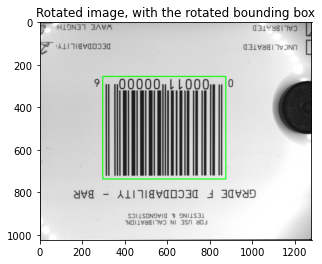

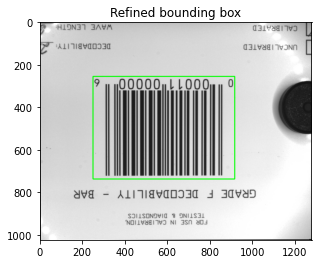

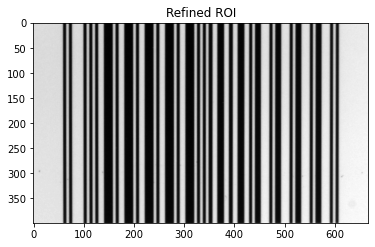

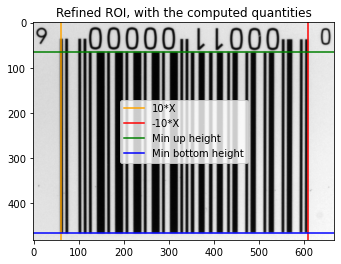

In [61]:
%%time
t = refine_roi(f'../images/{images_paths[52]}')
times.append(t)

Time for detecting the ROI: 0.02546525001525879
Time for rotating the image and the ROI: 0.016075611114501953
Time for computing the ROI quantities: 0.024087190628051758
Time for refining the ROI: 0.03951430320739746
Overall time: 0.10514235496520996
Wall time: 105 ms


0.10514235496520996

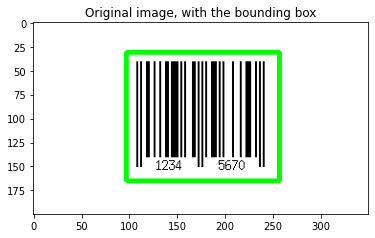

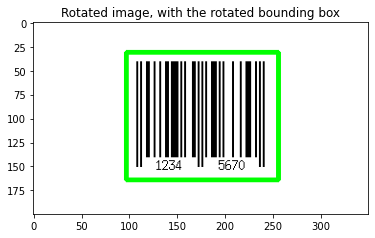

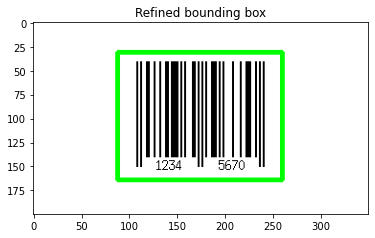

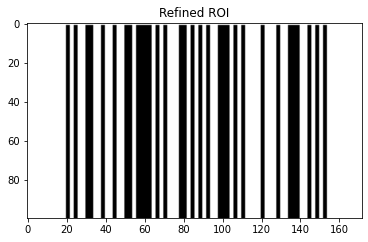

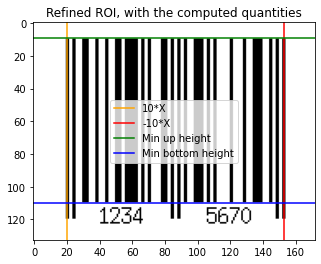

In [62]:
%%time
refine_roi('../other images/1.png')

Time for detecting the ROI: 0.14004254341125488
Time for rotating the image and the ROI: 0.05543804168701172


IndexError: index 1599 is out of bounds for axis 1 with size 1599

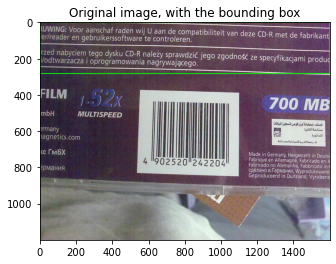

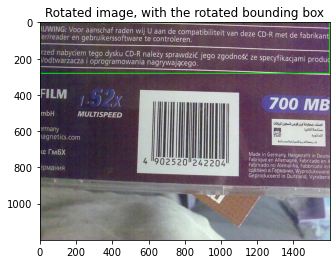

In [63]:
%%time
refine_roi('../other images/2.jpg')

Time for detecting the ROI: 0.12068867683410645
Time for rotating the image and the ROI: 0.05625271797180176


IndexError: index 1199 is out of bounds for axis 1 with size 1199

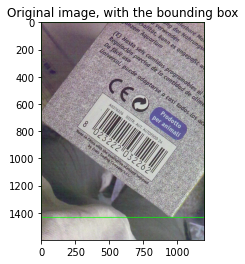

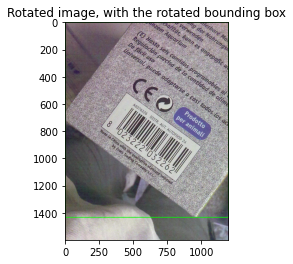

In [64]:
%%time
refine_roi('../other images/3.jpg')  # NO ROTATION INVARIANCE

### Average time (milliseconds)

In [65]:
np.mean(times)

0.29037879943847655